## Libraries

In [1]:
# Installing libraries
!pip install numpy
!pip install pandas
!pip install matplotlib
!pip install sklearn
!pip install tqdm
!pip install scipy
!pip install cdlib
!pip install pyvis

# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics.cluster import rand_score
from tqdm import tqdm
from functools import cmp_to_key
import scipy
import copy
from cdlib import algorithms
import networkx as nx
from cdlib import evaluation
import random
import csv
from pyvis.network import Network
from IPython.core.display import display, HTML

     |████████████████████████████████| 228 kB 13.0 MB/s 
     |████████████████████████████████| 50 kB 5.3 MB/s 
     |████████████████████████████████| 2.6 MB 68.0 MB/s 
     |████████████████████████████████| 14.2 MB 44.9 MB/s 
     |████████████████████████████████| 3.1 MB 62.6 MB/s 
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395122 sha256=14e1dabf57071abf141d0d3619843264cca04febc3c18b0f9d1010b631a875a7
  Stored in directory: /root/.cache/pip/wheels/ea/87/6b/1e0568b5ba9dc6518a25338bae90bd8392f35206bb90bb10f1
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149866 sha256=5af723d909dd1f8ccc03a29204ba83e662a1a24dd7a411d8d633d6f8cecb0299
  Stored in directory: /root/.cache/pip/wheels/05/5f/ca/7c4367734892581bb5ff896f15027a932c551080b2abd3e00d
Successfully built pyclustering python-Levenshtein
  Created wheel for pyvis: filename=pyvis-0.2.0-py3-none-any.whl size=23677 sha256=6cee27372

## Datasets

In [ ]:
# Dataset 1: email-Eu-core network

# Download the dataset
!wget "https://snap.stanford.edu/data/email-Eu-core.txt.gz"
!wget "https://snap.stanford.edu/data/email-Eu-core-department-labels.txt.gz"

# Unzip the test dataset
!gunzip "email-Eu-core.txt.gz"
!gunzip "email-Eu-core-department-labels.txt.gz"

--2022-04-30 01:43:13--  https://snap.stanford.edu/data/email-Eu-core.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79754 (78K) [application/x-gzip]
Saving to: ‘email-Eu-core.txt.gz’

email-Eu-core.txt.g 100%[===================>]  77.88K   387KB/s    in 0.2s    

2022-04-30 01:43:14 (387 KB/s) - ‘email-Eu-core.txt.gz’ saved [79754/79754]

--2022-04-30 01:43:14--  https://snap.stanford.edu/data/email-Eu-core-department-labels.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2663 (2.6K) [application/x-gzip]
Saving to: ‘email-Eu-core-department-labels.txt.gz’

email-Eu-core-depar 100%[===================>]   2.60K  --.-KB/s    in 0s      

2022-04-30 01:43:14 (151 MB/s

In [ ]:
# Dataset 2: General Relativity and Quantum Cosmology collaboration network

# Download the dataset
!wget "https://snap.stanford.edu/data/ca-GrQc.txt.gz"

# Unzip the test dataset
!gunzip "ca-GrQc.txt.gz"

--2022-04-30 04:31:20--  https://snap.stanford.edu/data/ca-GrQc.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109261 (107K) [application/x-gzip]
Saving to: ‘ca-GrQc.txt.gz’

ca-GrQc.txt.gz      100%[===================>] 106.70K   525KB/s    in 0.2s    

2022-04-30 04:31:20 (525 KB/s) - ‘ca-GrQc.txt.gz’ saved [109261/109261]



In [ ]:
# Dataset 3: High Energy Physics - Theory collaboration network

# Download the dataset
!wget "https://snap.stanford.edu/data/ca-HepTh.txt.gz"
!wget "https://snap.stanford.edu/data/cit-HepTh-abstracts.tar.gz"

# Unzip the test dataset
!gunzip "ca-HepTh.txt.gz"
!gunzip "cit-HepTh-abstracts.tar.gz"

--2022-04-30 04:49:54--  https://snap.stanford.edu/data/ca-HepTh.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 210596 (206K) [application/x-gzip]
Saving to: ‘ca-HepTh.txt.gz’

ca-HepTh.txt.gz     100%[===================>] 205.66K   605KB/s    in 0.3s    

2022-04-30 04:49:54 (605 KB/s) - ‘ca-HepTh.txt.gz’ saved [210596/210596]

--2022-04-30 04:49:54--  https://snap.stanford.edu/data/cit-HepTh-abstracts.tar.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11956788 (11M) [application/x-gzip]
Saving to: ‘cit-HepTh-abstracts.tar.gz’

cit-HepTh-abstracts 100%[===================>]  11.40M  5.75MB/s    in 2.0s    

2022-04-30 04:49:56 (5.75 MB/s) - ‘cit-HepTh-abstracts.tar.gz

In [ ]:
# Dataset 4: LastFM Asia Social Network

# Download the dataset
!wget "https://snap.stanford.edu/data/lastfm_asia.zip"

# Unzip the test dataset
!unzip "lastfm_asia.zip"

--2022-04-30 07:08:09--  https://snap.stanford.edu/data/lastfm_asia.zip
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6527202 (6.2M) [application/zip]
Saving to: ‘lastfm_asia.zip’

lastfm_asia.zip     100%[===================>]   6.22M  8.19MB/s    in 0.8s    

2022-04-30 07:08:09 (8.19 MB/s) - ‘lastfm_asia.zip’ saved [6527202/6527202]

Archive:  lastfm_asia.zip
   creating: lasftm_asia/
  inflating: lasftm_asia/lastfm_asia_edges.csv  
  inflating: lasftm_asia/lastfm_asia_target.csv  
  inflating: lasftm_asia/lastfm_asia_features.json  
  inflating: lasftm_asia/README.txt  


In [2]:
# Dataset 5: Social circles: Facebook

# Download the dataset
!wget "https://snap.stanford.edu/data/facebook.tar.gz"
!wget "https://snap.stanford.edu/data/facebook_combined.txt.gz"

# Unzip the test dataset
!gunzip "facebook.tar.gz"
!gunzip "facebook_combined.txt.gz"

--2022-04-30 11:16:02--  https://snap.stanford.edu/data/facebook.tar.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 732104 (715K) [application/x-gzip]
Saving to: ‘facebook.tar.gz’

facebook.tar.gz     100%[===================>] 714.95K   341KB/s    in 2.1s    

2022-04-30 11:16:05 (341 KB/s) - ‘facebook.tar.gz’ saved [732104/732104]

--2022-04-30 11:16:05--  https://snap.stanford.edu/data/facebook_combined.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 218576 (213K) [application/x-gzip]
Saving to: ‘facebook_combined.txt.gz’

facebook_combined.t 100%[===================>] 213.45K   204KB/s    in 1.0s    

2022-04-30 11:16:07 (204 KB/s) - ‘facebook_combined.txt.gz’ saved 

## Datasets Pre-processing

In [ ]:
# Preprocess Dataset 1

with open("email-Eu-core.txt") as f:
    lines = f.readlines()
f.close()

edges_email = []
for line in tqdm(lines):
  x, y = list(map(int, line.split('\n')[0].split()))
  if ([y, x] not in edges_email and [x, y] not in edges_email and x != y):
    edges_email.append([x, y])

# edges_email = np.array([np.array(edge) for edge in edges_email])

with open("email-Eu-core-department-labels.txt") as f:
  lines = f.readlines()
f.close()

temp_list = []
for line in tqdm(lines):
  x, label = list(map(int, line.split('\n')[0].split()))
  temp_list.append([x, label])
temp_list.sort(key = lambda pair: pair[0])
labels_email = [temp_list[i][1] for i in range(len(temp_list))]

adj_list_email = {i: [] for i in range(len(labels_email))}
for edge in edges_email:
  x, y = edge
  if (x != y):
    adj_list_email[x].append(y)
    adj_list_email[y].append(x)

adj_list_email = {i: np.array(adj_list_email[i]) for i in range(len(labels_email))}

print()
print("Total number of nodes: ", len(labels_email))
print("Total number of edges (undirected): ", len(edges_email))

100%|██████████| 1005/1005 [00:00<00:00, 253993.46it/s]


Total number of nodes:  1005
Total number of edges (undirected):  16064


In [ ]:
# Preprocess Dataset 2

with open("ca-GrQc.txt") as f:
    lines = f.readlines()
f.close()

lines = [[int(line.split("\t")[0]), int(line.split("\t")[1][:-2])] for line in lines[4:]]

edges_grqc = []
nodes = []
for line in tqdm(lines):
  x, y = line
  x = int(x)
  y = int(y)
  if x not in nodes:
    nodes.append(x)
  if y not in nodes:
    nodes.append(y)
  if ([y, x] not in edges_grqc and [x, y] not in edges_grqc and x != y):
    edges_grqc.append([x, y])

# edges_email = np.array([np.array(edge) for edge in edges_email])

adj_list_grqc = {i: [] for i in nodes}
for edge in edges_grqc:
  x, y = edge
  if (x != y):
    adj_list_grqc[x].append(y)
    adj_list_grqc[y].append(x)

adj_list_grqc = {i: np.array(adj_list_grqc[i]) for i in nodes}

print()
print("Total number of nodes: ", len(nodes))
print("Total number of edges (undirected): ", len(edges_grqc))

100%|██████████| 28980/28980 [00:33<00:00, 857.07it/s]



Total number of nodes:  6785
Total number of edges (undirected):  28474


In [ ]:
# Preprocess Dataset 3

with open("ca-HepTh.txt") as f:
    lines = f.readlines()
f.close()

lines =  [[int(line.split("\t")[0]), int(line.split("\t")[1].split("\n")[0])] for line in lines[4:]]

edges_hepth = []
nodes = []
for line in tqdm(lines):
  x, y = line
  x = int(x)
  y = int(y)
  if x not in nodes:
    nodes.append(x)
  if y not in nodes:
    nodes.append(y)
  if ([y, x] not in edges_hepth and [x, y] not in edges_hepth and x != y):
    edges_hepth.append([x, y])

# edges_email = np.array([np.array(edge) for edge in edges_email])

adj_list_hepth = {i: [] for i in nodes}
for edge in edges_hepth:
  x, y = edge
  if (x != y):
    adj_list_hepth[x].append(y)
    adj_list_hepth[y].append(x)

adj_list_hepth = {i: np.array(adj_list_hepth[i]) for i in nodes}

print()
print("Total number of nodes: ", len(nodes))
print("Total number of edges (undirected): ", len(edges_hepth))

100%|██████████| 51971/51971 [00:40<00:00, 1268.61it/s]



Total number of nodes:  9877
Total number of edges (undirected):  25973


In [ ]:
# Preprocess Dataset 4

with open("/content/lasftm_asia/lastfm_asia_edges.csv") as f:
    lines = f.readlines()
f.close()

lines = [[int(line.split(",")[0]), int(line.split(",")[1].split("\n")[0])] for line in lines[1:]]

edges_lastfm = []
nodes = []
for line in tqdm(lines):
  x, y = line
  x = int(x)
  y = int(y)
  if x not in nodes:
    nodes.append(x)
  if y not in nodes:
    nodes.append(y)
  if ([y, x] not in edges_lastfm and [x, y] not in edges_lastfm and x != y):
    edges_lastfm.append([x, y])

# edges_email = np.array([np.array(edge) for edge in edges_email])

adj_list_lastfm = {i: [] for i in nodes}
for edge in edges_lastfm:
  x, y = edge
  if (x != y):
    adj_list_lastfm[x].append(y)
    adj_list_lastfm[y].append(x)

adj_list_lastfm = {i: np.array(adj_list_lastfm[i]) for i in nodes}

print()
print("Total number of nodes: ", len(nodes))
print("Total number of edges (undirected): ", len(edges_lastfm))

100%|██████████| 27806/27806 [00:36<00:00, 769.16it/s]


Total number of nodes:  7624
Total number of edges (undirected):  27806


In [3]:
# Preprocess Dataset 5

with open("facebook_combined.txt") as f:
    lines = f.readlines()
f.close()

edges_facebook = []
nodes = []
for line in tqdm(lines):
  x, y = list(map(int, line[:-1].split()))
  x = int(x)
  y = int(y)
  if x not in nodes:
    nodes.append(x)
  if y not in nodes:
    nodes.append(y)
  if ([y, x] not in edges_facebook and [x, y] not in edges_facebook and x != y):
    edges_facebook.append([x, y])

# edges_email = np.array([np.array(edge) for edge in edges_email])

adj_list_facebook = {i: [] for i in nodes}
for edge in edges_facebook:
  x, y = edge
  if (x != y):
    adj_list_facebook[x].append(y)
    adj_list_facebook[y].append(x)

adj_list_facebook = {i: np.array(adj_list_facebook[i]) for i in nodes}

print()
print("Total number of nodes: ", len(nodes))
print("Total number of edges (undirected): ", len(edges_facebook))

100%|██████████| 88234/88234 [03:45<00:00, 390.77it/s]



Total number of nodes:  4039
Total number of edges (undirected):  88234


## Implementation of Sparsification Algorithms

In [4]:
# Sparsification Algorithms

# Jaccard Similarity
def jaccard_distance(adj_a, adj_b):
  return len(np.intersect1d(adj_a,adj_b))/len(np.union1d(adj_a,adj_b))

# Random Sparsification
def select_uniformly_and_randomly (edges, graph, sparse_ratio):
  n = len(edges)
  new_edges = random.sample(edges, int(n*sparse_ratio))
  return new_edges

# Global Sparsification
def global_sparsification (edges, graph, sparse_ratio):
  n = len(edges)
  e_sim = []
  for edge in tqdm(edges):
    a = edge[0]
    b = edge[1]
    sim_ab = jaccard_distance(graph[a], graph[b])
    e_sim.append([sim_ab,edge])
  e_sim.sort(key = lambda x: x[0])
  e_sim.reverse()
  new_n = int(n*sparse_ratio)
  new_edges = []
  for i in range(new_n):
    new_edges.append(e_sim[i][1])
  return new_edges

# Local Sparsification
def local_sparsification (edges, graph, sparse_ratio):
  n = len(graph)
  new_edges = []
  degree = [len(graph[ver]) for ver in graph.keys()]
  sparse_exponent = sparse_ratio
  while (sum([pow(d, sparse_exponent) for d in degree]) < 2 * sparse_ratio * len(edges)):
    new_sparse_exponent = sparse_exponent * (1.2)
    if (new_sparse_exponent >= 1):
      break
    sparse_exponent = new_sparse_exponent
  for i in tqdm(graph.keys()):
    d_i = len(graph[i])
    d_edges_sim = []
    for j in graph[i]:
      sim_ij = jaccard_distance(graph[i], graph[j])
      d_edges_sim.append([sim_ij, [int(i), int(j)]])
    d_edges_sim.sort(key = lambda x: x[0])
    d_edges_sim.reverse()
    d_e = int(pow(d_i, sparse_exponent))
    for i in range(d_e):
      x = d_edges_sim[i][1][0]
      y = d_edges_sim[i][1][1]
      if ([y, x] not in new_edges and [x, y] not in new_edges):
        new_edges.append(d_edges_sim[i][1])
  return new_edges

# Probability based Global Sparsification
def probable_global_sparsification (edges, graph, sparse_ratio):
  n = len(edges)
  e_sim = []
  for edge in tqdm(edges):
    a = edge[0]
    b = edge[1]
    sim_ab = jaccard_distance(graph[a], graph[b])
    e_sim.append([sim_ab, edge])
  new_n = int(n*sparse_ratio)
  norm_factor = sum([pair[0] for pair in e_sim])
  indices = []
  if (new_n < sum([1 if pair[0] > 0 else 0 for pair in e_sim])):
    indices = np.random.choice(len(e_sim), new_n, p = [pair[0]/norm_factor for pair in e_sim], replace = False)
  else:
    for i in range(len(e_sim)):
      if (e_sim[i][0] > 0):
        indices.append(i)
  new_edges = [e_sim[i][1] for i in indices]
  return new_edges

# Probability based Local Sparsification
def probable_local_sparsification (edges, graph, sparse_ratio):
  n = len(graph)
  new_edges = []
  degree = [len(graph[ver]) for ver in graph.keys()]
  sparse_exponent = sparse_ratio
  while (sum([pow(d, sparse_exponent) for d in degree]) < 2 * sparse_ratio * len(edges)):
    new_sparse_exponent = sparse_exponent * (1.2)
    if (new_sparse_exponent >= 1):
      break
    sparse_exponent = new_sparse_exponent
  for i in tqdm(graph.keys()):
    d_i = len(graph[i])
    d_edges_sim = []
    for j in graph[i]:
      sim_ij = jaccard_distance(graph[i], graph[j])
      d_edges_sim.append([sim_ij, [int(i), int(j)]])
    d_e = int(pow(d_i, sparse_exponent))
    norm_factor = sum([pair[0] for pair in d_edges_sim])
    if (norm_factor != 0):
      indices = []
      if (d_e < sum([1 if pair[0] > 0 else 0 for pair in d_edges_sim])):
        indices = np.random.choice(len(d_edges_sim), d_e, p = [pair[0]/norm_factor for pair in d_edges_sim], replace = False)
      else:
        for i in range(len(d_edges_sim)):
          if (d_edges_sim[i][0] > 0):
            indices.append(i)
      for i in indices:
        x = d_edges_sim[i][1][0]
        y = d_edges_sim[i][1][1]
        if ([y, x] not in new_edges and [x, y] not in new_edges):
          new_edges.append(d_edges_sim[i][1])
  return new_edges

# Independent Set Sparsification (Random Selection)
def independent_set_random (edges, graph, sparse_ratio):
  edge_set = set()
  for edge in edges:
    edge_set.add((int(edge[0]), int(edge[1])))
  adj_list = copy.deepcopy(graph)
  degree_dict = {}
  visited = {}
  ind_dict = {}
  for node in adj_list.keys():
    degree_dict[node] = len(adj_list[node])
    visited[node] = 0
    ind_dict[node] = 1

  while (True):
    highest_deg = max(degree_dict, key = degree_dict.get)
    if (degree_dict[highest_deg] <= -1):
      break
    if (not visited[highest_deg]):
      degree_dict[highest_deg] = -1
      visited[highest_deg] = 1
      if (degree_dict[highest_deg] > 0):
        ind_dict[highest_deg] = 0
      for node in adj_list[highest_deg]:
        if (degree_dict[node] != -1):
          degree_dict[node] -= 1
    else:
      degree_dict[highest_deg] = -1
  
  ind_set = [node for node in ind_dict.keys() if ind_dict[node] == 1]
  estimated_degree = int((sparse_ratio * len(edges))/len(ind_set))
  avg_degree = int(sum([len(adj_list[ver]) for ver in ind_set])/len(ind_set))
  estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  required_remove = len(edges) * (1 - sparse_ratio)
  while (estimate_remove > required_remove):
    avg_degree += 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  if (avg_degree > 1):
    avg_degree -= 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])

  removed_set = set()
  for node in tqdm(ind_set):
    if (avg_degree > estimated_degree and len(adj_list[node]) > avg_degree - estimated_degree):
      removed = random.sample(adj_list[node].tolist(), avg_degree - estimated_degree)
      for ver in removed:
        adj_list[ver] = np.setdiff1d(adj_list[ver], np.array([node]))
        adj_list[node] = np.setdiff1d(adj_list[node], np.array([ver]))
        removed_set.add((node, ver))
        removed_set.add((ver, node))

  new_edges = list(edge_set.difference(removed_set))
  return new_edges

# Independent Set Sparsification (Top Edges Selection)
def independent_set_top (edges, graph, sparse_ratio):
  edge_set = set()
  for edge in edges:
    edge_set.add((int(edge[0]), int(edge[1])))
  adj_list = copy.deepcopy(graph)
  degree_dict = {}
  visited = {}
  ind_dict = {}
  for node in adj_list.keys():
    degree_dict[node] = len(adj_list[node])
    visited[node] = 0
    ind_dict[node] = 1

  while (True):
    highest_deg = max(degree_dict, key = degree_dict.get)
    if (degree_dict[highest_deg] <= -1):
      break
    if (not visited[highest_deg]):
      degree_dict[highest_deg] = -1
      visited[highest_deg] = 1
      if (degree_dict[highest_deg] > 0):
        ind_dict[highest_deg] = 0
      for node in adj_list[highest_deg]:
        if (degree_dict[node] != -1):
          degree_dict[node] -= 1
    else:
      degree_dict[highest_deg] = -1
  
  ind_set = [node for node in ind_dict.keys() if ind_dict[node] == 1]
  estimated_degree = int((sparse_ratio * len(edges))/len(ind_set))
  avg_degree = int(sum([len(adj_list[ver]) for ver in ind_set])/len(ind_set))
  estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  required_remove = len(edges) * (1 - sparse_ratio)
  while (estimate_remove > required_remove):
    avg_degree += 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  if (avg_degree > 1):
    avg_degree -= 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])

  removed_set = set()
  for node in tqdm(ind_set):
    if (avg_degree > estimated_degree and len(adj_list[node]) > avg_degree - estimated_degree):
      e_sim = []
      for v in adj_list[node]:
        sim_ab = jaccard_distance(graph[node], graph[v])
        e_sim.append([sim_ab, v])
      e_sim.sort(key = lambda x: x[0])
      removed = [e_sim[i][1] for i in range(avg_degree - estimated_degree)]
      for ver in removed:
        adj_list[ver] = np.setdiff1d(adj_list[ver], np.array([node]))
        adj_list[node] = np.setdiff1d(adj_list[node], np.array([ver]))
        removed_set.add((node, ver))
        removed_set.add((ver, node))

  new_edges = list(edge_set.difference(removed_set))
  return new_edges

# Independent Set Sparsification (Probability based Selection)
def independent_set_probable (edges, graph, sparse_ratio):
  edge_set = set()
  for edge in edges:
    edge_set.add((int(edge[0]), int(edge[1])))
  adj_list = copy.deepcopy(graph)
  degree_dict = {}
  visited = {}
  ind_dict = {}
  for node in adj_list.keys():
    degree_dict[node] = len(adj_list[node])
    visited[node] = 0
    ind_dict[node] = 1

  while (True):
    highest_deg = max(degree_dict, key = degree_dict.get)
    if (degree_dict[highest_deg] <= -1):
      break
    if (not visited[highest_deg]):
      degree_dict[highest_deg] = -1
      visited[highest_deg] = 1
      if (degree_dict[highest_deg] > 0):
        ind_dict[highest_deg] = 0
      for node in adj_list[highest_deg]:
        if (degree_dict[node] != -1):
          degree_dict[node] -= 1
    else:
      degree_dict[highest_deg] = -1
  
  ind_set = [node for node in ind_dict.keys() if ind_dict[node] == 1]
  estimated_degree = int((sparse_ratio * len(edges))/len(ind_set))
  avg_degree = int(sum([len(adj_list[ver]) for ver in ind_set])/len(ind_set))
  estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  required_remove = len(edges) * (1 - sparse_ratio)
  while (estimate_remove > required_remove):
    avg_degree += 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])
  if (avg_degree > 1):
    avg_degree -= 1
    estimate_remove = sum([(avg_degree - estimated_degree) if len(adj_list[ver]) > (avg_degree - estimated_degree) else 0 for ver in ind_set])

  removed_set = set()
  for node in tqdm(ind_set):
    if (avg_degree > estimated_degree and len(adj_list[node]) > avg_degree - estimated_degree):
      e_sim = []
      for v in adj_list[node]:
        sim_ab = jaccard_distance(graph[node], graph[v])
        e_sim.append([sim_ab, v])
      e_sim.sort(key = lambda x: x[0])
      norm_factor = sum([(1 - pair[0]) for pair in e_sim])
      indices = np.random.choice(len(e_sim), avg_degree - estimated_degree, p = [(1 - pair[0])/norm_factor for pair in e_sim], replace = False)
      removed = [e_sim[i][1] for i in indices]
      for ver in removed:
        adj_list[ver] = np.setdiff1d(adj_list[ver], np.array([node]))
        adj_list[node] = np.setdiff1d(adj_list[node], np.array([ver]))
        removed_set.add((node, ver))
        removed_set.add((ver, node))

  new_edges = list(edge_set.difference(removed_set))
  return new_edges

In [5]:
# Evaluation

def train_and_evaluate_community_detection (edges_all, edges_sparse):
  G = nx.Graph()
  G.add_edges_from(edges_sparse)
  coms = algorithms.louvain(G, weight='weight', resolution=1.)
  G_all = nx.Graph()
  G_all.add_edges_from(edges_all)
  return evaluation.newman_girvan_modularity(G_all, coms).score

In [6]:
# Code for vizualizing Networks

def draw_network (edges, heading, name):
  G = nx.Graph()
  G.add_edges_from(edges)
  net = Network(height='600px', width='90%',heading=heading)
  net.from_nx(G)
  net.show(name + '.html')
  display(HTML(name + '.html'))

In [7]:
# Function to train and evaluate and vizualize sparcification techniques

def run_on_dataset (edges, graph, sparse_ratio_array, sparcification_techniques):
  # Applying Different Sparsification Techniques on Dataset
  
  dataset_data = [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
  edges_return = []
  for sparse_ratio in sparse_ratio_array:
    sparsification_fraction_array = [sparse_ratio for i in range(8)]
    edges_random = [] 
    edges_global_sparse = []
    edges_local_sparse = []
    edges_probglobal_sparse = []
    edges_problocal_sparse = []
    edges_ind_sparse = []
    edges_ind_top_sparse = []
    edges_ind_probable_sparse = []

    if "random" in sparcification_techniques:
      edges_random = select_uniformly_and_randomly(edges, graph, sparsification_fraction_array[0])
    if "global" in sparcification_techniques:
      edges_global_sparse = global_sparsification(edges, graph, sparsification_fraction_array[1])
    if "local" in sparcification_techniques:
      edges_local_sparse = local_sparsification(edges, graph, sparsification_fraction_array[2])
    if "prob_global" in sparcification_techniques:
      edges_probglobal_sparse = probable_global_sparsification(edges, graph, sparsification_fraction_array[3])
    if "prob_local" in sparcification_techniques:
      edges_problocal_sparse = probable_local_sparsification(edges, graph, sparsification_fraction_array[4])
    if "independent" in sparcification_techniques:
      edges_ind_sparse = independent_set_random(edges, graph, sparsification_fraction_array[5])
    if "independent_top" in sparcification_techniques:
      edges_ind_top_sparse = independent_set_top(edges, graph, sparsification_fraction_array[6])
    if "independent_probable" in sparcification_techniques:
      edges_ind_probable_sparse = independent_set_probable(edges, graph, sparsification_fraction_array[7])

    print("Total Edges: ", len(edges))
    if "random" in sparcification_techniques:
      print("Edges after Random Sparsification: ", len(edges_random))
    if "global" in sparcification_techniques:
      print("Edges after Global Sparsification: ", len(edges_global_sparse))
    if "local" in sparcification_techniques:
      print("Edges after Local Sparsification: ", len(edges_local_sparse))
    if "prob_global" in sparcification_techniques:
      print("Edges after Probable Global Sparsification: ", len(edges_probglobal_sparse))
    if "prob_local" in sparcification_techniques:
      print("Edges after Probable Local Sparsification: ", len(edges_problocal_sparse))
    if "independent" in sparcification_techniques:
      print("Edges after Independent Set Sparsification: ", len(edges_ind_sparse))
    if "independent_top" in sparcification_techniques:
      print("Edges after Independent Set via Top f% Sparsification: ", len(edges_ind_top_sparse))
    if "independent_probable" in sparcification_techniques:
      print("Edges after Independent Set via Probability Sparsification: ", len(edges_ind_probable_sparse))
    
    print()
    print("+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+")
    print()

    # Evaluating Different Sparsification Techniques

    score_overall = train_and_evaluate_community_detection(edges, edges)
    if "random" in sparcification_techniques:
      score_random_sparse = train_and_evaluate_community_detection(edges, edges_random)
    if "global" in sparcification_techniques:
      score_global_sparse = train_and_evaluate_community_detection(edges, edges_global_sparse)
    if "local" in sparcification_techniques:
      score_local_sparse = train_and_evaluate_community_detection(edges, edges_local_sparse)
    if "prob_global" in sparcification_techniques:
      score_probglobal_sparse = train_and_evaluate_community_detection(edges, edges_probglobal_sparse)
    if "prob_local" in sparcification_techniques:
      score_problocal_sparse = train_and_evaluate_community_detection(edges, edges_problocal_sparse)
    if "independent" in sparcification_techniques:
      score_ind_sparse = train_and_evaluate_community_detection(edges, edges_ind_sparse)
    if "independent_top" in sparcification_techniques:
      score_ind_top_sparse = train_and_evaluate_community_detection(edges, edges_ind_top_sparse)
    if "independent_probable" in sparcification_techniques:
      score_ind_probable_sparse = train_and_evaluate_community_detection(edges, edges_ind_probable_sparse)

    print("Newman Girvan Modularity Score on Original Graph: ", score_overall)
    if "random" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Random Sparsification: ", score_random_sparse)
    if "global" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Global Sparsification: ", score_global_sparse)
    if "local" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Local Sparsification: ", score_local_sparse)
    if "prob_global" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification: ", score_probglobal_sparse)
    if "prob_local" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Probable Local Sparsification: ", score_problocal_sparse)
    if "independent" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Independent Set Sparsification: ", score_ind_sparse)
    if "independent_top" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Independent Set via Top f% Sparsification: ", score_ind_top_sparse)
    if "independent_probable" in sparcification_techniques:
      print("Newman Girvan Modularity Score on Graph sparsed using Independent Set via Probability Sparsification: ", score_ind_probable_sparse)

    print()
    print("+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+")
    print()

    dataset_data[0].append(len(edges_random)/len(edges))
    dataset_data[1].append(score_random_sparse)
    dataset_data[2].append(len(edges_global_sparse)/len(edges))
    dataset_data[3].append(score_global_sparse)
    dataset_data[4].append(len(edges_local_sparse)/len(edges))
    dataset_data[5].append(score_local_sparse)
    dataset_data[6].append(len(edges_probglobal_sparse)/len(edges))
    dataset_data[7].append(score_probglobal_sparse)
    dataset_data[8].append(len(edges_problocal_sparse)/len(edges))
    dataset_data[9].append(score_problocal_sparse)
    dataset_data[10].append(len(edges_ind_sparse)/len(edges))
    dataset_data[11].append(score_ind_sparse)
    dataset_data[12].append(len(edges_ind_top_sparse)/len(edges))
    dataset_data[13].append(score_ind_top_sparse)
    dataset_data[14].append(len(edges_ind_probable_sparse)/len(edges))
    dataset_data[15].append(score_ind_probable_sparse)

    edges_return.append([edges, edges_random, edges_global_sparse, edges_local_sparse, edges_probglobal_sparse, edges_problocal_sparse, edges_ind_sparse, edges_ind_top_sparse, edges_ind_probable_sparse])

  with open("dataset5_data.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerows(dataset_data)
  return edges_return, dataset_data

## Evaluation

In [ ]:
# Running on GR-QC Dataset

edges_array_grqc, dataset1_data = run_on_dataset(edges_grqc, adj_list_grqc, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], ["random", "global", "local", "prob_global", "prob_local", "independent", "independent_top", "independent_probable"])

100%|██████████| 6785/6785 [00:02<00:00, 2771.42it/s]


Total Edges:  28474
Edges after Random Sparsification:  2847
Edges after Global Sparsification:  2847
Edges after Local Sparsification:  5989
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  318
Edges after Independent Set Sparsification:  15090
Edges after Independent Set via Top f% Sparsification:  15279
Edges after Independent Set via Probability Sparsification:  15062

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6106334977598468
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.09183880551152408
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.02807654041631969
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.2700448401388401
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00240361191507107

100%|██████████| 6785/6785 [00:02<00:00, 2825.95it/s]


Total Edges:  28474
Edges after Random Sparsification:  5694
Edges after Global Sparsification:  5694
Edges after Local Sparsification:  8179
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  577
Edges after Independent Set Sparsification:  15083
Edges after Independent Set via Top f% Sparsification:  15279
Edges after Independent Set via Probability Sparsification:  15132

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6104390723896196
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.21477941909290071
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.07408710311349029
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.3799936012821482
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00238398979538277

100%|██████████| 6785/6785 [00:02<00:00, 2718.04it/s]


Total Edges:  28474
Edges after Random Sparsification:  8542
Edges after Global Sparsification:  8542
Edges after Local Sparsification:  12099
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  665
Edges after Independent Set Sparsification:  15484
Edges after Independent Set via Top f% Sparsification:  15616
Edges after Independent Set via Probability Sparsification:  15568

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6105577239888337
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.2968677914858165
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.10209712486474987
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.4952721193930285
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00240361191507107

100%|██████████| 6785/6785 [00:02<00:00, 2720.00it/s]


Total Edges:  28474
Edges after Random Sparsification:  11389
Edges after Global Sparsification:  11389
Edges after Local Sparsification:  17828
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  757
Edges after Independent Set Sparsification:  15526
Edges after Independent Set via Top f% Sparsification:  15616
Edges after Independent Set via Probability Sparsification:  15556

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6127410471146519
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.37622272854063715
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.13385531189416622
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.5612939355836686
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00238398979538

100%|██████████| 6785/6785 [00:01<00:00, 4299.83it/s]


Total Edges:  28474
Edges after Random Sparsification:  14237
Edges after Global Sparsification:  14237
Edges after Local Sparsification:  24626
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  796
Edges after Independent Set Sparsification:  17203
Edges after Independent Set via Top f% Sparsification:  17220
Edges after Independent Set via Probability Sparsification:  17203

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6077776825704598
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.4492199628343803
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.1910201486373163
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.5980829863732922
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.0023839897953827

100%|██████████| 6785/6785 [00:01<00:00, 6269.98it/s]


Total Edges:  28474
Edges after Random Sparsification:  17084
Edges after Global Sparsification:  17084
Edges after Local Sparsification:  24626
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  796
Edges after Independent Set Sparsification:  19972
Edges after Independent Set via Top f% Sparsification:  19634
Edges after Independent Set via Probability Sparsification:  20102

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6161558022500612
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.49362709592396725
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.22453725691296952
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.5995787687535181
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00240361191507

100%|██████████| 6785/6785 [00:00<00:00, 8866.70it/s] 


Total Edges:  28474
Edges after Random Sparsification:  19931
Edges after Global Sparsification:  19931
Edges after Local Sparsification:  23618
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  790
Edges after Independent Set Sparsification:  22218
Edges after Independent Set via Top f% Sparsification:  22082
Edges after Independent Set via Probability Sparsification:  22116

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6085919351674608
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5211900700021614
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.26750558657498
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.593698978819453
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.002383989795382772


100%|██████████| 6785/6785 [00:00<00:00, 13448.40it/s]


Total Edges:  28474
Edges after Random Sparsification:  22779
Edges after Global Sparsification:  22779
Edges after Local Sparsification:  27738
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  798
Edges after Independent Set Sparsification:  24064
Edges after Independent Set via Top f% Sparsification:  24019
Edges after Independent Set via Probability Sparsification:  24064

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6153993318557857
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5613249419616206
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.3209113144129409
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.606175683703893
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.00240361191507107

100%|██████████| 6785/6785 [00:00<00:00, 25670.09it/s]


Total Edges:  28474
Edges after Random Sparsification:  25626
Edges after Global Sparsification:  25626
Edges after Local Sparsification:  25956
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  798
Edges after Independent Set Sparsification:  26154
Edges after Independent Set via Top f% Sparsification:  26270
Edges after Independent Set via Probability Sparsification:  26212

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6149239706197035
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5923213657800468
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.4047354655077965
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.5996695165860109
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.0024036119150710

100%|██████████| 6785/6785 [00:00<00:00, 286979.81it/s]


Total Edges:  28474
Edges after Random Sparsification:  28474
Edges after Global Sparsification:  28474
Edges after Local Sparsification:  28474
Edges after Probable Global Sparsification:  798
Edges after Probable Local Sparsification:  798
Edges after Independent Set Sparsification:  28381
Edges after Independent Set via Top f% Sparsification:  28381
Edges after Independent Set via Probability Sparsification:  28381

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.6126996074278527
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.6115710894829882
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.6095629371601424
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.6067568661224398
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  -0.0024036119150710

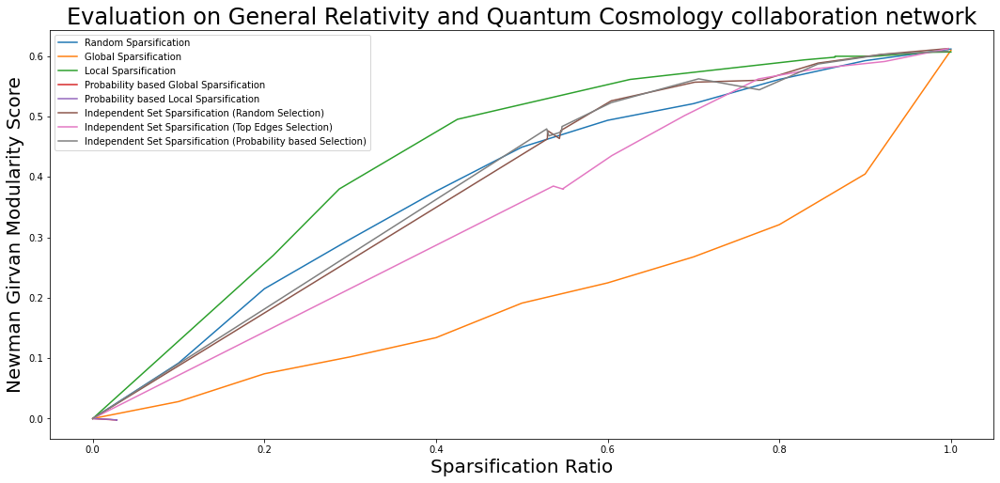

In [ ]:
# Plotting for GR-QC Dataset

for i in range(8):
  data = [[dataset1_data[2*i][j], dataset1_data[2*i + 1][j]] for j in range(len(dataset1_data[2*i]))]
  data.sort(key = lambda x: x[0])
  dataset1_data[2*i] = [data[j][0] for j in range(len(data))]
  dataset1_data[2*i + 1] = [data[j][1] for j in range(len(data))]

f = plt.figure()
f.set_figwidth(18)
f.set_figheight(8)
plt.xlabel("Sparsification Ratio", fontsize=20)
plt.ylabel("Newman Girvan Modularity Score", fontsize=20)
plt.title("Evaluation on General Relativity and Quantum Cosmology collaboration network", fontsize=24)
plt.plot(dataset1_data[0], dataset1_data[1], label = "Random Sparsification")
plt.plot(dataset1_data[2], dataset1_data[3], label = "Global Sparsification")
plt.plot(dataset1_data[4], dataset1_data[5], label = "Local Sparsification")
plt.plot(dataset1_data[6], dataset1_data[7], label = "Probability based Global Sparsification")
plt.plot(dataset1_data[8], dataset1_data[9], label = "Probability based Local Sparsification")
plt.plot(dataset1_data[10], dataset1_data[11], label = "Independent Set Sparsification (Random Selection)")
plt.plot(dataset1_data[12], dataset1_data[13], label = "Independent Set Sparsification (Top Edges Selection)")
plt.plot(dataset1_data[14], dataset1_data[15], label = "Independent Set Sparsification (Probability based Selection)")
plt.legend()
plt.savefig("dataset1_eval.png")
plt.show()

In [ ]:
# Running on HEP-TH dataset

edges_array_hepth, dataset1_data = run_on_dataset(edges_hepth, adj_list_hepth, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], ["random", "global", "local", "prob_global", "prob_local", "independent", "independent_top", "independent_probable"])

100%|██████████| 9877/9877 [00:02<00:00, 4411.64it/s] 


Total Edges:  25973
Edges after Random Sparsification:  2597
Edges after Global Sparsification:  2597
Edges after Local Sparsification:  7509
Edges after Probable Global Sparsification:  2597
Edges after Probable Local Sparsification:  6462
Edges after Independent Set Sparsification:  14457
Edges after Independent Set via Top f% Sparsification:  13913
Edges after Independent Set via Probability Sparsification:  14389

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7696193343089894
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.07329372034355058
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.06059005846439568
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.47228478186113493
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.091503226070341

100%|██████████| 9877/9877 [00:02<00:00, 4404.87it/s] 


Total Edges:  25973
Edges after Random Sparsification:  5194
Edges after Global Sparsification:  5194
Edges after Local Sparsification:  7588
Edges after Probable Global Sparsification:  5194
Edges after Probable Local Sparsification:  6522
Edges after Independent Set Sparsification:  14533
Edges after Independent Set via Top f% Sparsification:  13913
Edges after Independent Set via Probability Sparsification:  14357

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7689070858213454
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.20455923749372304
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.13031976879034085
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.49152322750144867
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.208145225456614

100%|██████████| 9877/9877 [00:02<00:00, 4410.43it/s] 


Total Edges:  25973
Edges after Random Sparsification:  7791
Edges after Global Sparsification:  7791
Edges after Local Sparsification:  9548
Edges after Probable Global Sparsification:  7791
Edges after Probable Local Sparsification:  8656
Edges after Independent Set Sparsification:  14505
Edges after Independent Set via Top f% Sparsification:  13913
Edges after Independent Set via Probability Sparsification:  14373

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7692541924554777
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.32672876701719133
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.22723256267078507
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.6146002584604846
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.3407336896529777

100%|██████████| 9877/9877 [00:02<00:00, 4040.03it/s] 


Total Edges:  25973
Edges after Random Sparsification:  10389
Edges after Global Sparsification:  10389
Edges after Local Sparsification:  13625
Edges after Probable Global Sparsification:  10389
Edges after Probable Local Sparsification:  12815
Edges after Independent Set Sparsification:  14933
Edges after Independent Set via Top f% Sparsification:  14444
Edges after Independent Set via Probability Sparsification:  14915

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.77095914216922
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.44102370788400297
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.34183990017538185
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.6958402158217389
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.4311969788694

100%|██████████| 9877/9877 [00:01<00:00, 5958.14it/s] 


Total Edges:  25973
Edges after Random Sparsification:  12986
Edges after Global Sparsification:  12986
Edges after Local Sparsification:  17687
Edges after Probable Global Sparsification:  12986
Edges after Probable Local Sparsification:  16793
Edges after Independent Set Sparsification:  15389
Edges after Independent Set via Top f% Sparsification:  15085
Edges after Independent Set via Probability Sparsification:  15237

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7700405437335022
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5277866589685161
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.454363387151852
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7320614839506561
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.49431591447873

100%|██████████| 9877/9877 [00:01<00:00, 8605.85it/s] 


Total Edges:  25973
Edges after Random Sparsification:  15583
Edges after Global Sparsification:  15583
Edges after Local Sparsification:  21853
Edges after Probable Global Sparsification:  15583
Edges after Probable Local Sparsification:  20281
Edges after Independent Set Sparsification:  17614
Edges after Independent Set via Top f% Sparsification:  17263
Edges after Independent Set via Probability Sparsification:  17406

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7683249580357835
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.6028462809964209
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.5265667623775259
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7514131194371674
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.5524694806221

100%|██████████| 9877/9877 [00:00<00:00, 13083.20it/s]


Total Edges:  25973
Edges after Random Sparsification:  18181
Edges after Global Sparsification:  18181
Edges after Local Sparsification:  20999
Edges after Probable Global Sparsification:  18181
Edges after Probable Local Sparsification:  19631
Edges after Independent Set Sparsification:  19961
Edges after Independent Set via Top f% Sparsification:  19763
Edges after Independent Set via Probability Sparsification:  19979

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7719005668347998
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.6670856411757077
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.5745731150736151
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7506946042425877
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.5828957710525

100%|██████████| 9877/9877 [00:00<00:00, 19792.67it/s]


Total Edges:  25973
Edges after Random Sparsification:  20778
Edges after Global Sparsification:  20778
Edges after Local Sparsification:  24580
Edges after Probable Global Sparsification:  20778
Edges after Probable Local Sparsification:  21934
Edges after Independent Set Sparsification:  21902
Edges after Independent Set via Top f% Sparsification:  21741
Edges after Independent Set via Probability Sparsification:  21902

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7688764712347156
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7039133227104641
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.6061406199021199
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7630472367736623
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.6082603266669

100%|██████████| 9877/9877 [00:00<00:00, 37830.93it/s]


Total Edges:  25973
Edges after Random Sparsification:  23375
Edges after Global Sparsification:  23375
Edges after Local Sparsification:  22863
Edges after Probable Global Sparsification:  22415
Edges after Probable Local Sparsification:  21011
Edges after Independent Set Sparsification:  23733
Edges after Independent Set via Top f% Sparsification:  23733
Edges after Independent Set via Probability Sparsification:  23701

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7679597131577577
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7444802648902283
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.6538217738675127
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7586648771017094
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.6162499266283

100%|██████████| 9877/9877 [00:00<00:00, 415442.96it/s]


Total Edges:  25973
Edges after Random Sparsification:  25973
Edges after Global Sparsification:  25973
Edges after Local Sparsification:  25973
Edges after Probable Global Sparsification:  22415
Edges after Probable Local Sparsification:  22415
Edges after Independent Set Sparsification:  25909
Edges after Independent Set via Top f% Sparsification:  25909
Edges after Independent Set via Probability Sparsification:  25909

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.7680324336408128
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7697222305980111
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.7660901940127871
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7685385723238536
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.6158519562729

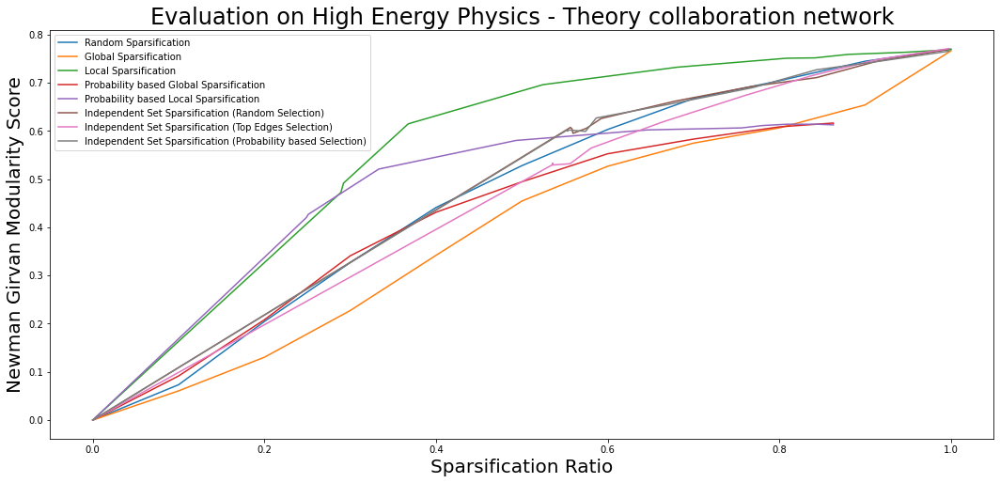

In [ ]:
# Plotting for HEP-TH Dataset

for i in range(8):
  data = [[dataset1_data[2*i][j], dataset1_data[2*i + 1][j]] for j in range(len(dataset1_data[2*i]))]
  data.sort(key = lambda x: x[0])
  dataset1_data[2*i] = [data[j][0] for j in range(len(data))]
  dataset1_data[2*i + 1] = [data[j][1] for j in range(len(data))]

f = plt.figure()
f.set_figwidth(18)
f.set_figheight(8)
plt.xlabel("Sparsification Ratio", fontsize=20)
plt.ylabel("Newman Girvan Modularity Score", fontsize=20)
plt.title("Evaluation on High Energy Physics - Theory collaboration network", fontsize=24)
plt.plot(dataset1_data[0], dataset1_data[1], label = "Random Sparsification")
plt.plot(dataset1_data[2], dataset1_data[3], label = "Global Sparsification")
plt.plot(dataset1_data[4], dataset1_data[5], label = "Local Sparsification")
plt.plot(dataset1_data[6], dataset1_data[7], label = "Probability based Global Sparsification")
plt.plot(dataset1_data[8], dataset1_data[9], label = "Probability based Local Sparsification")
plt.plot(dataset1_data[10], dataset1_data[11], label = "Independent Set Sparsification (Random Selection)")
plt.plot(dataset1_data[12], dataset1_data[13], label = "Independent Set Sparsification (Top Edges Selection)")
plt.plot(dataset1_data[14], dataset1_data[15], label = "Independent Set Sparsification (Probability based Selection)")
plt.legend()
plt.savefig("dataset3_eval.png")
plt.show()

In [ ]:
# Running on LastFM Dataset

edges_array_lastfm, dataset5_data = run_on_dataset(edges_lastfm, adj_list_lastfm, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], ["random", "global", "local", "prob_global", "prob_local", "independent", "independent_top", "independent_probable"])

100%|██████████| 7624/7624 [00:02<00:00, 3233.82it/s]


Total Edges:  27806
Edges after Random Sparsification:  2780
Edges after Global Sparsification:  2780
Edges after Local Sparsification:  6561
Edges after Probable Global Sparsification:  2780
Edges after Probable Local Sparsification:  3991
Edges after Independent Set Sparsification:  15578
Edges after Independent Set via Top f% Sparsification:  15596
Edges after Independent Set via Probability Sparsification:  15608

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.814744269811083
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.0514775212149111
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.040860925061340266
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.3507790247519513
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.06891341869292605

100%|██████████| 7624/7624 [00:02<00:00, 3199.10it/s]


Total Edges:  27806
Edges after Random Sparsification:  5561
Edges after Global Sparsification:  5561
Edges after Local Sparsification:  7627
Edges after Probable Global Sparsification:  5561
Edges after Probable Local Sparsification:  5231
Edges after Independent Set Sparsification:  15524
Edges after Independent Set via Top f% Sparsification:  15596
Edges after Independent Set via Probability Sparsification:  15596

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8144706268799885
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.1908780972712845
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.09417951913973453
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.5630192788932586
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.15934010908256074

100%|██████████| 7624/7624 [00:02<00:00, 3187.67it/s]


Total Edges:  27806
Edges after Random Sparsification:  8341
Edges after Global Sparsification:  8341
Edges after Local Sparsification:  12059
Edges after Probable Global Sparsification:  8341
Edges after Probable Local Sparsification:  9754
Edges after Independent Set Sparsification:  15786
Edges after Independent Set via Top f% Sparsification:  15971
Edges after Independent Set via Probability Sparsification:  15711

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8144683104533585
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.34842177352772435
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.15049971355981448
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7223285003473676
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.227387324869934

100%|██████████| 7624/7624 [00:02<00:00, 3233.28it/s]


Total Edges:  27806
Edges after Random Sparsification:  11122
Edges after Global Sparsification:  11122
Edges after Local Sparsification:  17197
Edges after Probable Global Sparsification:  11122
Edges after Probable Local Sparsification:  14282
Edges after Independent Set Sparsification:  15861
Edges after Independent Set via Top f% Sparsification:  15971
Edges after Independent Set via Probability Sparsification:  15811

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8145285847537618
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.4615068584025017
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.21184732267565332
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7791200015775
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.277270472010765

100%|██████████| 7624/7624 [00:01<00:00, 4273.15it/s]


Total Edges:  27806
Edges after Random Sparsification:  13903
Edges after Global Sparsification:  13903
Edges after Local Sparsification:  18132
Edges after Probable Global Sparsification:  13903
Edges after Probable Local Sparsification:  15112
Edges after Independent Set Sparsification:  16630
Edges after Independent Set via Top f% Sparsification:  16014
Edges after Independent Set via Probability Sparsification:  16542

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8155048020804473
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5423912329959486
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.2889007718959525
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7894478440286619
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.3288307951307

100%|██████████| 7624/7624 [00:01<00:00, 5589.81it/s]


Total Edges:  27806
Edges after Random Sparsification:  16683
Edges after Global Sparsification:  16683
Edges after Local Sparsification:  23422
Edges after Probable Global Sparsification:  16683
Edges after Probable Local Sparsification:  18875
Edges after Independent Set Sparsification:  18966
Edges after Independent Set via Top f% Sparsification:  18226
Edges after Independent Set via Probability Sparsification:  19066

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.815621551405304
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.6330430503711596
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.33897968974462034
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.808426234931789
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.36025492144432

100%|██████████| 7624/7624 [00:00<00:00, 8363.08it/s]


Total Edges:  27806
Edges after Random Sparsification:  19464
Edges after Global Sparsification:  19464
Edges after Local Sparsification:  22376
Edges after Probable Global Sparsification:  19464
Edges after Probable Local Sparsification:  18227
Edges after Independent Set Sparsification:  20730
Edges after Independent Set via Top f% Sparsification:  20324
Edges after Independent Set via Probability Sparsification:  20759

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8140455425461507
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.6766891693394484
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.38000504779239536
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8028613820971019
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.384136459678

100%|██████████| 7624/7624 [00:00<00:00, 12547.35it/s]


Total Edges:  27806
Edges after Random Sparsification:  22244
Edges after Global Sparsification:  22244
Edges after Local Sparsification:  26269
Edges after Probable Global Sparsification:  20475
Edges after Probable Local Sparsification:  20291
Edges after Independent Set Sparsification:  23033
Edges after Independent Set via Top f% Sparsification:  22689
Edges after Independent Set via Probability Sparsification:  22904

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8134133688955734
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7393740518074272
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.4385255383953617
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8121008112076922
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.3865837670000

100%|██████████| 7624/7624 [00:00<00:00, 22696.61it/s]


Total Edges:  27806
Edges after Random Sparsification:  25025
Edges after Global Sparsification:  25025
Edges after Local Sparsification:  24526
Edges after Probable Global Sparsification:  20475
Edges after Probable Local Sparsification:  19514
Edges after Independent Set Sparsification:  25142
Edges after Independent Set via Top f% Sparsification:  25142
Edges after Independent Set via Probability Sparsification:  25142

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8134868278152205
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7645825380936814
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.5590378679181972
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8092948011486533
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.3868805722573

100%|██████████| 7624/7624 [00:00<00:00, 268034.95it/s]


Total Edges:  27806
Edges after Random Sparsification:  27806
Edges after Global Sparsification:  27806
Edges after Local Sparsification:  27806
Edges after Probable Global Sparsification:  20475
Edges after Probable Local Sparsification:  20475
Edges after Independent Set Sparsification:  27591
Edges after Independent Set via Top f% Sparsification:  27591
Edges after Independent Set via Probability Sparsification:  27591

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.815953746513933
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8145874059523677
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.8139838293710263
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8156704123574122
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.38572978224260

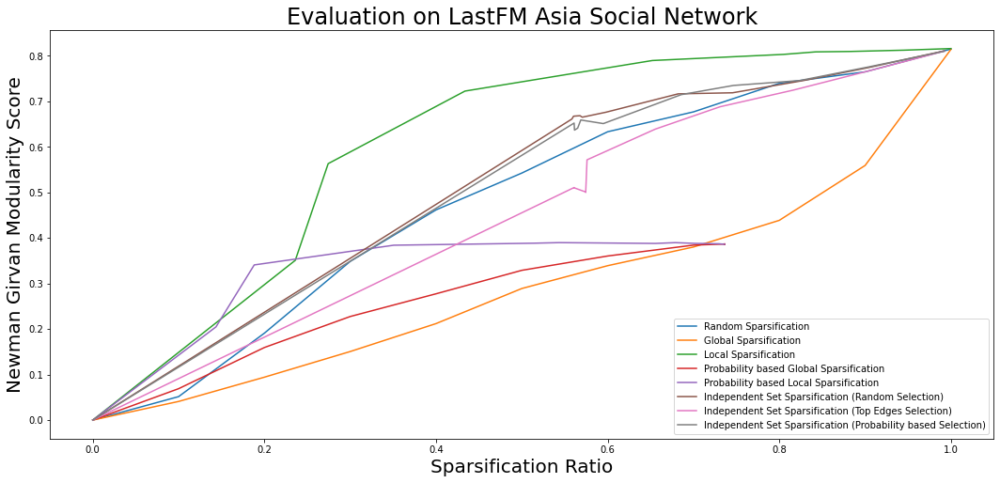

In [ ]:
# Plotting for LastFM Dataset

for i in range(8):
  data = [[dataset5_data[2*i][j], dataset5_data[2*i + 1][j]] for j in range(len(dataset5_data[2*i]))]
  data.sort(key = lambda x: x[0])
  dataset5_data[2*i] = [data[j][0] for j in range(len(data))]
  dataset5_data[2*i + 1] = [data[j][1] for j in range(len(data))]

f = plt.figure()
f.set_figwidth(18)
f.set_figheight(8)
plt.xlabel("Sparsification Ratio", fontsize=20)
plt.ylabel("Newman Girvan Modularity Score", fontsize=20)
plt.title("Evaluation on LastFM Asia Social Network", fontsize=24)
plt.plot(dataset5_data[0], dataset5_data[1], label = "Random Sparsification")
plt.plot(dataset5_data[2], dataset5_data[3], label = "Global Sparsification")
plt.plot(dataset5_data[4], dataset5_data[5], label = "Local Sparsification")
plt.plot(dataset5_data[6], dataset5_data[7], label = "Probability based Global Sparsification")
plt.plot(dataset5_data[8], dataset5_data[9], label = "Probability based Local Sparsification")
plt.plot(dataset5_data[10], dataset5_data[11], label = "Independent Set Sparsification (Random Selection)")
plt.plot(dataset5_data[12], dataset5_data[13], label = "Independent Set Sparsification (Top Edges Selection)")
plt.plot(dataset5_data[14], dataset5_data[15], label = "Independent Set Sparsification (Probability based Selection)")
plt.legend()
plt.savefig("dataset5_eval.png")
plt.show()

In [8]:
# Running on Social Circles: Facebook Dataset

edges_array_facebook, dataset4_data = run_on_dataset(edges_facebook, adj_list_facebook, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], ["random", "global", "local", "prob_global", "prob_local", "independent", "independent_top", "independent_probable"])

100%|██████████| 4039/4039 [00:07<00:00, 519.05it/s]


Total Edges:  88234
Edges after Random Sparsification:  8823
Edges after Global Sparsification:  8823
Edges after Local Sparsification:  12742
Edges after Probable Global Sparsification:  8823
Edges after Probable Local Sparsification:  14817
Edges after Independent Set Sparsification:  42834
Edges after Independent Set via Top f% Sparsification:  44354
Edges after Independent Set via Probability Sparsification:  42634

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8349337765640645
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.5121687461321579
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  -0.024883755440473495
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.7308298065508937
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.3080416472008

100%|██████████| 4039/4039 [00:07<00:00, 514.35it/s]


Total Edges:  88234
Edges after Random Sparsification:  17646
Edges after Global Sparsification:  17646
Edges after Local Sparsification:  38416
Edges after Probable Global Sparsification:  17646
Edges after Probable Local Sparsification:  43657
Edges after Independent Set Sparsification:  42748
Edges after Independent Set via Top f% Sparsification:  44534
Edges after Independent Set via Probability Sparsification:  42900

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8349619892505195
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7231007457107717
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  -0.047283197508400196
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8107906288211464
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.5011786433

100%|██████████| 4039/4039 [00:07<00:00, 505.37it/s] 


Total Edges:  88234
Edges after Random Sparsification:  26470
Edges after Global Sparsification:  26470
Edges after Local Sparsification:  42833
Edges after Probable Global Sparsification:  26470
Edges after Probable Local Sparsification:  48308
Edges after Independent Set Sparsification:  42658
Edges after Independent Set via Top f% Sparsification:  44674
Edges after Independent Set via Probability Sparsification:  42910

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8338894031344464
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.7832788944719682
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  -0.06579192588734012
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8111454696406231
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.61484946557

100%|██████████| 4039/4039 [00:05<00:00, 763.94it/s]


Total Edges:  88234
Edges after Random Sparsification:  35293
Edges after Global Sparsification:  35293
Edges after Local Sparsification:  57134
Edges after Probable Global Sparsification:  35293
Edges after Probable Local Sparsification:  62642
Edges after Independent Set Sparsification:  51498
Edges after Independent Set via Top f% Sparsification:  51252
Edges after Independent Set via Probability Sparsification:  50842

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8348820287612512
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8015408654218544
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  -0.0751670652424112
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.818205869484833
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.6878107353641

100%|██████████| 4039/4039 [00:03<00:00, 1086.69it/s]


Total Edges:  88234
Edges after Random Sparsification:  44117
Edges after Global Sparsification:  44117
Edges after Local Sparsification:  64253
Edges after Probable Global Sparsification:  44117
Edges after Probable Local Sparsification:  69271
Edges after Independent Set Sparsification:  62014
Edges after Independent Set via Top f% Sparsification:  59848
Edges after Independent Set via Probability Sparsification:  60760

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8348811587172856
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8158052291402326
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.07746156995316694
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8211443736485455
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.734243703071

100%|██████████| 4039/4039 [00:02<00:00, 1423.69it/s]


Total Edges:  88234
Edges after Random Sparsification:  52940
Edges after Global Sparsification:  52940
Edges after Local Sparsification:  64253
Edges after Probable Global Sparsification:  52940
Edges after Probable Local Sparsification:  69133
Edges after Independent Set Sparsification:  67810
Edges after Independent Set via Top f% Sparsification:  65602
Edges after Independent Set via Probability Sparsification:  66982

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8346084559696193
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8182095526088706
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.11768923567615244
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8211434476653836
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.760110374385

100%|██████████| 4039/4039 [00:02<00:00, 1947.08it/s]


Total Edges:  88234
Edges after Random Sparsification:  61763
Edges after Global Sparsification:  61763
Edges after Local Sparsification:  59233
Edges after Probable Global Sparsification:  61763
Edges after Probable Local Sparsification:  64577
Edges after Independent Set Sparsification:  73564
Edges after Independent Set via Top f% Sparsification:  71608
Edges after Independent Set via Probability Sparsification:  72586

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8343924170589686
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8227172471510517
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.18064715519047098
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8207141507478771
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.781666341967

100%|██████████| 4039/4039 [00:01<00:00, 2949.57it/s]


Total Edges:  88234
Edges after Random Sparsification:  70587
Edges after Global Sparsification:  70587
Edges after Local Sparsification:  83422
Edges after Probable Global Sparsification:  70587
Edges after Probable Local Sparsification:  84692
Edges after Independent Set Sparsification:  78952
Edges after Independent Set via Top f% Sparsification:  76950
Edges after Independent Set via Probability Sparsification:  78406

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8349748284842454
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8216783575288464
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.5285458469502592
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8334803761797438
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.7899522696410

100%|██████████| 4039/4039 [00:00<00:00, 4274.90it/s]


Total Edges:  88234
Edges after Random Sparsification:  79410
Edges after Global Sparsification:  79410
Edges after Local Sparsification:  71787
Edges after Probable Global Sparsification:  79410
Edges after Probable Local Sparsification:  75700
Edges after Independent Set Sparsification:  82127
Edges after Independent Set via Top f% Sparsification:  81142
Edges after Independent Set via Probability Sparsification:  82127

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8349405290865813
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8294156276868844
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.7647033083489936
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8281394503837362
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.8074847701241

100%|██████████| 4039/4039 [00:00<00:00, 26534.96it/s]


Total Edges:  88234
Edges after Random Sparsification:  88234
Edges after Global Sparsification:  88234
Edges after Local Sparsification:  88234
Edges after Probable Global Sparsification:  88156
Edges after Probable Local Sparsification:  88156
Edges after Independent Set Sparsification:  87190
Edges after Independent Set via Top f% Sparsification:  87190
Edges after Independent Set via Probability Sparsification:  87190

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+

Newman Girvan Modularity Score on Original Graph:  0.8357841621087465
Newman Girvan Modularity Score on Graph sparsed using Random Sparsification:  0.8349291779896184
Newman Girvan Modularity Score on Graph sparsed using Global Sparsification:  0.835796588445694
Newman Girvan Modularity Score on Graph sparsed using Local Sparsification:  0.8344834998789341
Newman Girvan Modularity Score on Graph sparsed using Probable Global Sparsification:  0.81901581339890

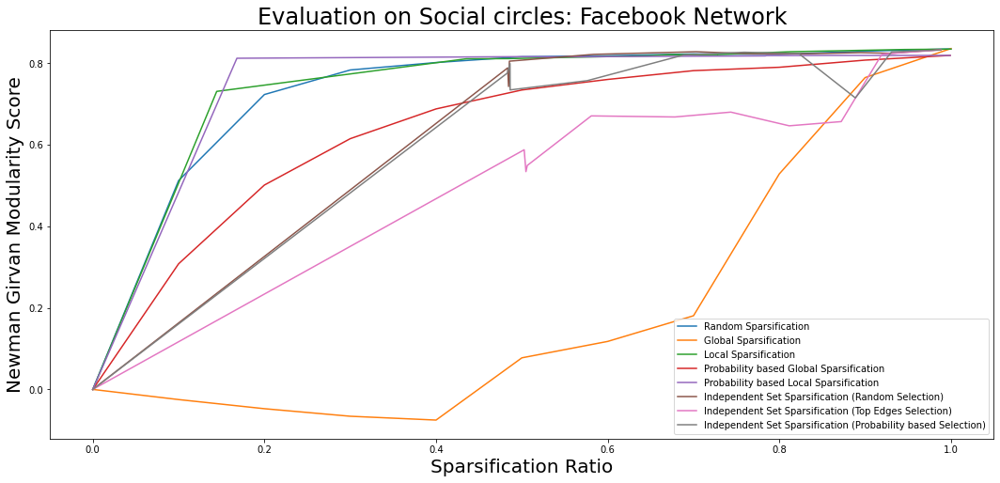

In [9]:
# Plotting for Social Circles: Facebook Dataset

for i in range(8):
  data = [[dataset4_data[2*i][j], dataset4_data[2*i + 1][j]] for j in range(len(dataset4_data[2*i]))]
  data.sort(key = lambda x: x[0])
  dataset4_data[2*i] = [data[j][0] for j in range(len(data))]
  dataset4_data[2*i + 1] = [data[j][1] for j in range(len(data))]

f = plt.figure()
f.set_figwidth(18)
f.set_figheight(8)
plt.xlabel("Sparsification Ratio", fontsize=20)
plt.ylabel("Newman Girvan Modularity Score", fontsize=20)
plt.title("Evaluation on Social circles: Facebook Network", fontsize=24)
plt.plot(dataset4_data[0], dataset4_data[1], label = "Random Sparsification")
plt.plot(dataset4_data[2], dataset4_data[3], label = "Global Sparsification")
plt.plot(dataset4_data[4], dataset4_data[5], label = "Local Sparsification")
plt.plot(dataset4_data[6], dataset4_data[7], label = "Probability based Global Sparsification")
plt.plot(dataset4_data[8], dataset4_data[9], label = "Probability based Local Sparsification")
plt.plot(dataset4_data[10], dataset4_data[11], label = "Independent Set Sparsification (Random Selection)")
plt.plot(dataset4_data[12], dataset4_data[13], label = "Independent Set Sparsification (Top Edges Selection)")
plt.plot(dataset4_data[14], dataset4_data[15], label = "Independent Set Sparsification (Probability based Selection)")
plt.legend()
plt.savefig("dataset4_eval.png")
plt.show()

## Visualizations

In [ ]:
draw_network(edges_array_email[9][1], "Dataset 1 - Random", "random_9")

In [ ]:
draw_network(edges_array_email[6][1], "Dataset 1 - Random", "random_6")

In [ ]:
draw_network(edges_array_email[4][1], "Dataset 1 - Random", "random_4")

In [ ]:
draw_network(edges_array_email[2][1], "Dataset 1 - Random", "random_2")

In [ ]:
draw_network(edges_array_email[9][2], "Dataset 1 - Global", "random_9")

In [ ]:
draw_network(edges_array_email[6][2], "Dataset 1 - Global", "random_6")

In [ ]:
draw_network(edges_array_email[4][2], "Dataset 1 - Global", "random_4")

In [ ]:
draw_network(edges_array_email[2][2], "Dataset 1 - Global", "random_2")

In [ ]:
draw_network(edges_array_email[9][3], "Dataset 1 - Local", "random_9")

In [ ]:
draw_network(edges_array_email[6][3], "Dataset 1 - Local", "random_6")

In [ ]:
draw_network(edges_array_email[4][3], "Dataset 1 - Local", "random_4")

In [ ]:
draw_network(edges_array_email[2][3], "Dataset 1 - Local", "random_2")

In [ ]:
draw_network(edges_array_email[9][6], "Dataset 1 - Independent", "independent_9")

In [ ]:
draw_network(edges_array_email[6][6], "Dataset 1 - Independent", "independent_6")

In [ ]:
draw_network(edges_array_email[4][6], "Dataset 1 - Independent", "independent_4")

In [ ]:
draw_network(edges_array_email[2][6], "Dataset 1 - Independent", "independent_2")